STAMapper enables gene module detection. Here we utilized Slide-tages human cortex data to show this result, The scRNA-seq dataset and the scST dataset can be download from [Google Drive](https://drive.google.com/drive/folders/1xP3Fh94AwKu4OsH3khGq-KEw0VCoiRnL) (Slide_tags_cortex.zip).

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import scanpy as sc
from STAMapper import pipeline, pp, pl
from STAMapper.utils.analyze import *
from matplotlib import pyplot as plt
import shutil
import pickle
import seaborn as sns
import STAMapper
import warnings
warnings.filterwarnings("ignore")

In [2]:
key_class1 = 'celltype'
key_class2 = 'celltype'
key_classes = [key_class1, key_class2]

## load data

In [3]:
adata_sc = sc.read_h5ad(r'../data/adata_sc.h5ad')
adata_sp = sc.read_h5ad(r'../data/slide_tag_cortex.h5ad') 

sc_name = 'cortex_sc'
sp_name = 'slide_tag_cortex'

## Training

In [4]:
adatas = [adata_sc, adata_sp]
dsnames = (sc_name, sp_name)#change dsnames for a new training task
if os.path.exists(Path(".") /'_temp' / f'{dsnames}'):
    shutil.rmtree(Path(".") /'_temp' / f'{dsnames}')
    
outputs = pipeline.training(adatas=adatas, dsnames=dsnames, key_classes=key_classes)

Data Preprocessing!
[leiden] Time used:  1.2247 s
a new directory made:
	_temp\('cortex_sc', 'slide_tag_cortex')\0\figs
already exists:
	_temp\('cortex_sc', 'slide_tag_cortex')\0
[*] Setting dataset names:
	0-->cortex_sc
	1-->slide_tag_cortex
[*] Setting aligned features for observation nodes (self._features)
[*] Setting observation-by-variable adjacent matrices (`self._ov_adjs`) for making merged graph adjacent matrix of observation and variable nodes
-------------------- Summary of the DGL-Heterograph --------------------
Graph(num_nodes={'cell': 157538, 'gene': 3149},
      num_edges={('cell', 'express', 'gene'): 69012106, ('cell', 'self_loop_cell', 'cell'): 157538, ('cell', 'similar_to', 'cell'): 1072358, ('gene', 'expressed_by', 'cell'): 69012106, ('gene', 'self_loop_gene', 'gene'): 3149},
      metagraph=[('cell', 'gene', 'express'), ('cell', 'cell', 'self_loop_cell'), ('cell', 'cell', 'similar_to'), ('gene', 'cell', 'expressed_by'), ('gene', 'gene', 'self_loop_gene')])
self-loop

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:03<00:00,  6.46it/s]


object saved into:
	 _temp\('cortex_sc', 'slide_tag_cortex')\0\datapair_init.pickle


## Check accuracy

In [5]:
folder_path = Path(".") /'_temp' / f'{dsnames}'
best_model, accuracy, macrof1, weightedf1 = pp.calc_scores(folder_path, key_class2)
print(f"Best Model: {best_model}, Accuracy: {accuracy:.3f}, Macro F1 Score: {macrof1:.3f}, Weighted F1 Score: {weightedf1:.3f}")

Best Model: 0, Accuracy: 0.925, Macro F1 Score: 0.743, Weighted F1 Score: 0.925


## load gene embedding and perform gene module extration

In [6]:
hidden_list = STAMapper.load_hidden_states(folder_path/f'{best_model}'/'hidden_list.h5')
adt_gene = sc.AnnData(hidden_list[-1]['gene'])

with open(folder_path/f'{best_model}'/'datapair_init.pickle', 'rb') as file:
    data = pickle.load(file)

adt_gene.obs.index = list(data['varnames_node'])

In [7]:
sc.pp.neighbors(adt_gene, n_neighbors=5, metric='cosine', use_rep='X')
sc.tl.leiden(adt_gene, resolution=0.2, key_added='module')
sc.tl.umap(adt_gene)

<Axes: title={'center': 'module'}, xlabel='UMAP1', ylabel='UMAP2'>

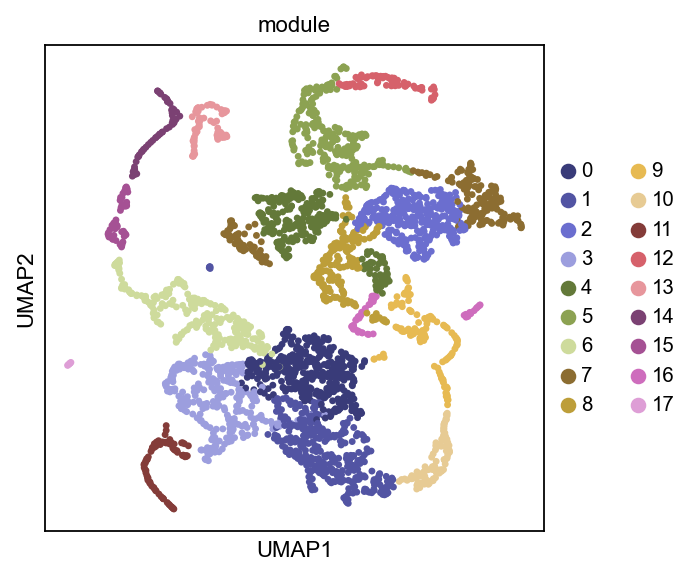

In [8]:
sc.pl.umap(adt_gene, color='module', ncols=1, palette='tab20b', show=False)

## Visualize gene modules on sc and sp data

Here, we averaged the expression levels of genes within each module to represent the module's overall expression, and visualized them on sc and sp data, respectively.

In [9]:
obs = pd.read_csv(folder_path/f'{best_model}'/'obs.csv',index_col=0)
obs_sp = obs[obs['dataset'].isin([sp_name])]
adata_sp.obs['predicted'] = list(obs_sp['predicted'])

In [10]:
sc.pp.normalize_total(adata_sc, target_sum=1e4)
sc.pp.log1p(adata_sc)

sc.pp.normalize_total(adata_sp, target_sum=1e4)
sc.pp.log1p(adata_sp)

In [11]:
module_list = list(set(adt_gene.obs['module']))
module_genes = {}
for ele in module_list:
    module_genes[ele] = list(adt_gene.obs[adt_gene.obs['module'].isin([ele])].index)
    
for module_ID in module_genes.keys():
    adata_sp.obs['module_'+str(module_ID)] = adata_sp[:,module_genes[module_ID]].X.mean(axis=1)
    adata_sc.obs['module_'+str(module_ID)] = adata_sc[:,module_genes[module_ID]].X.mean(axis=1)

In [12]:
sc.pp.scale(adata_sc, max_value=10)
sc.tl.pca(adata_sc, svd_solver='arpack')
sc.pp.neighbors(adata_sc, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_sc)

sc.pp.scale(adata_sp, max_value=10)
sc.tl.pca(adata_sp, svd_solver='arpack')
sc.pp.neighbors(adata_sp, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_sp)

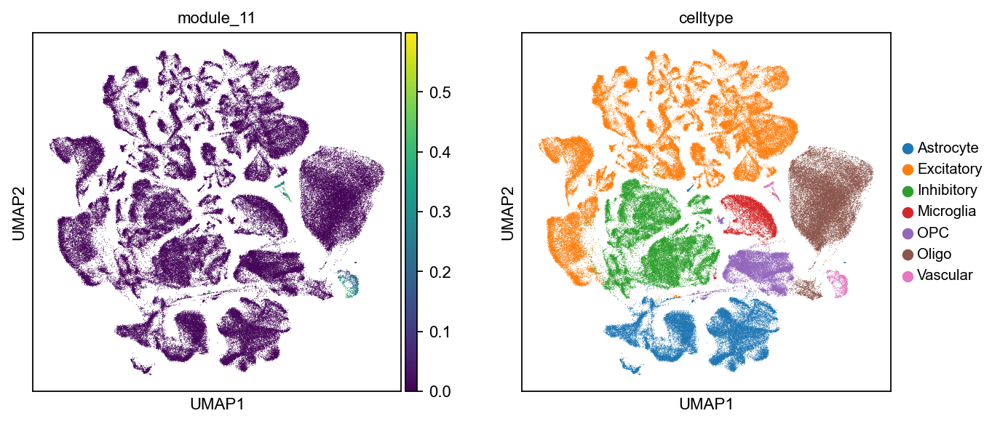

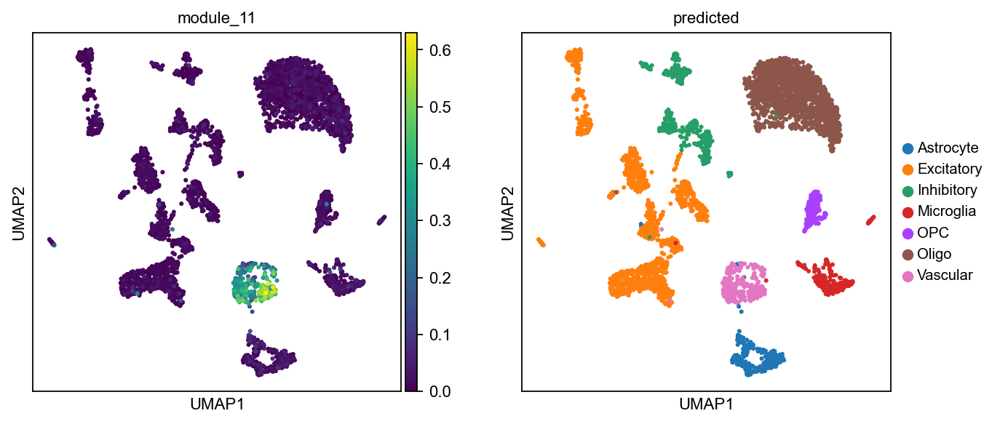

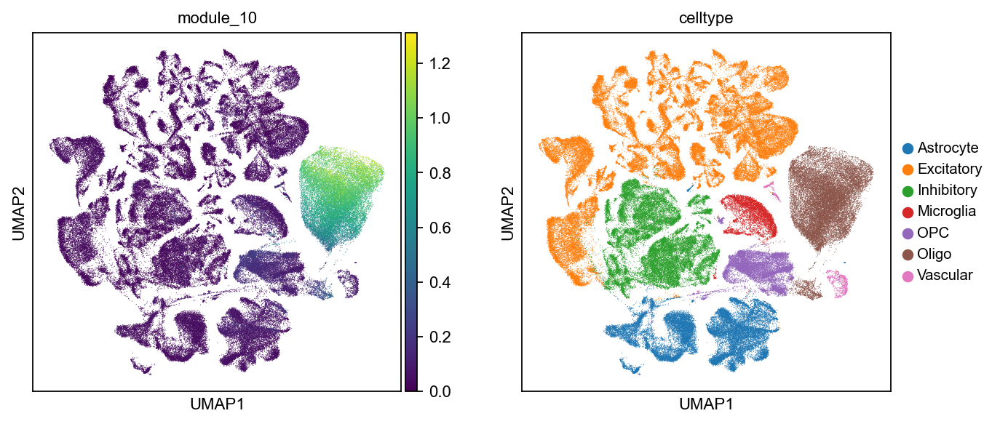

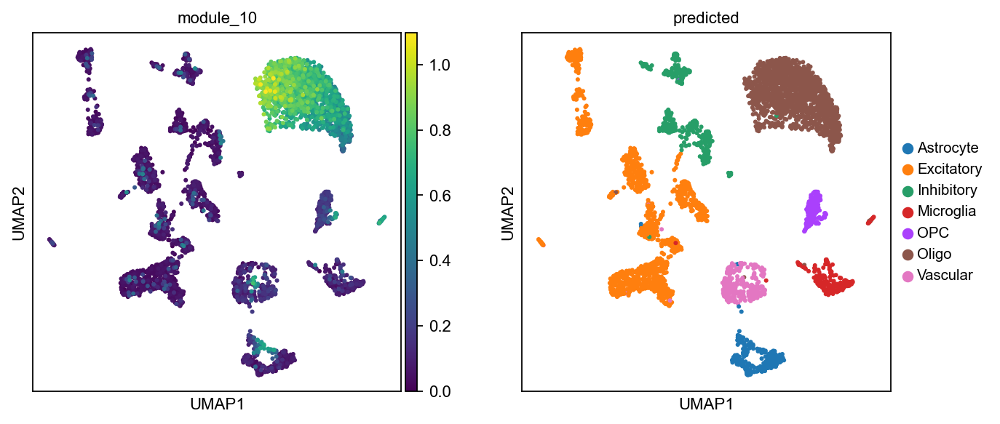

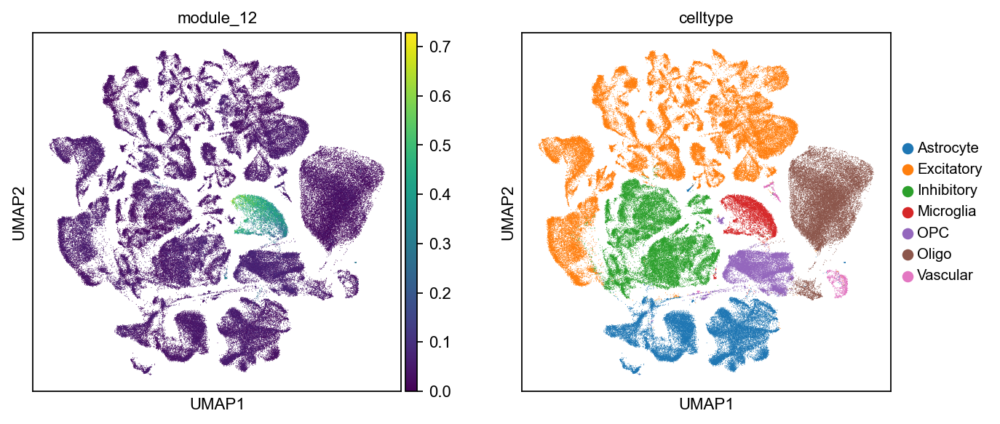

...

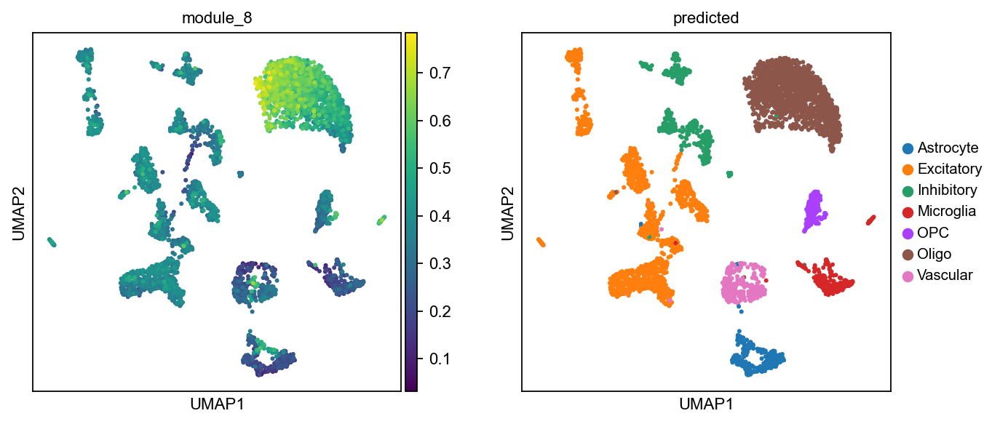

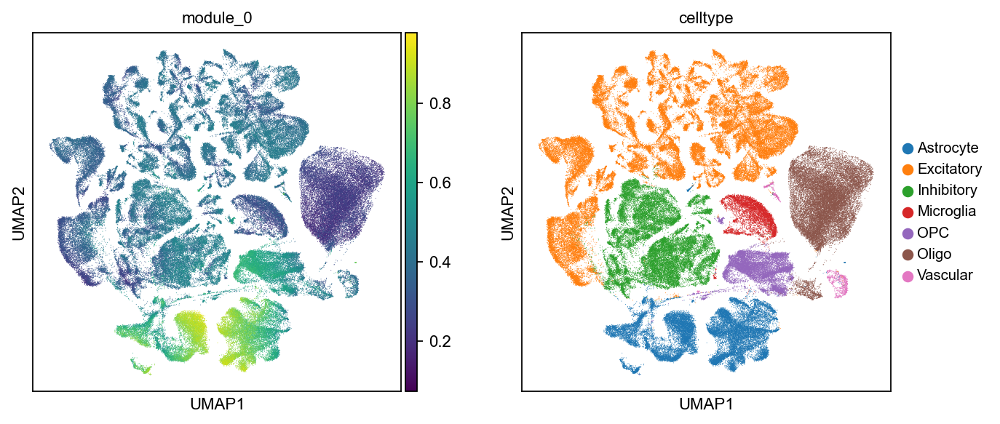

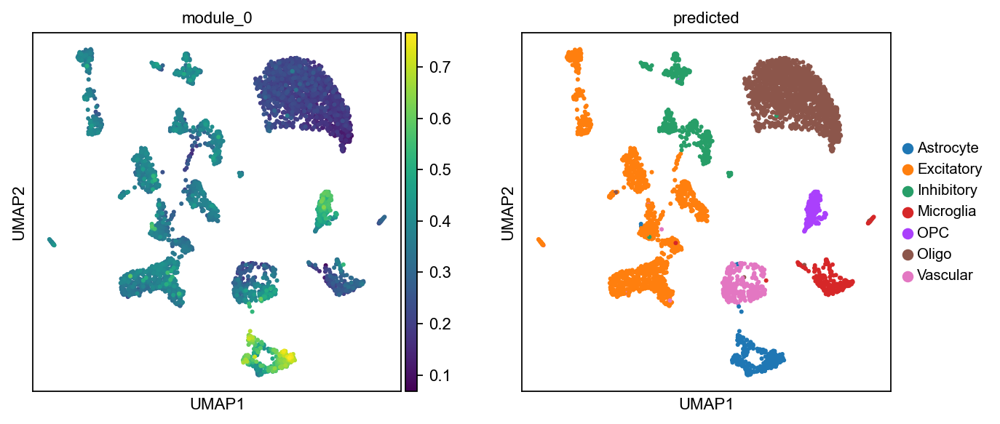

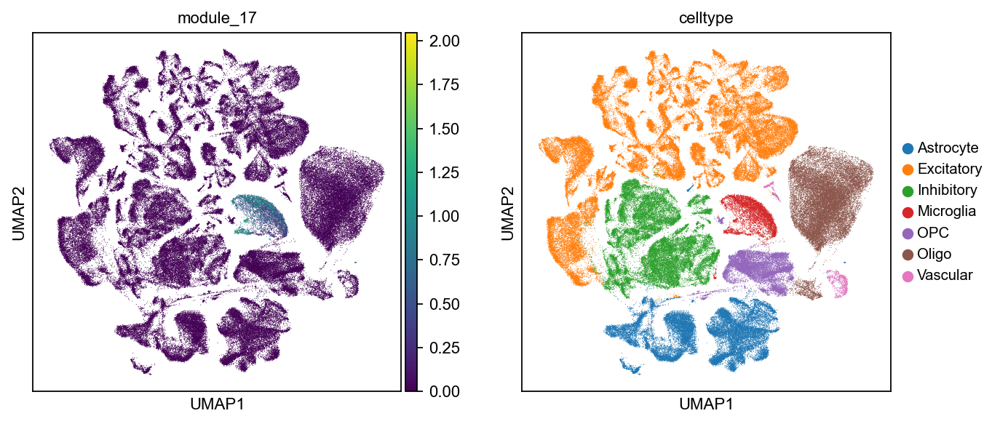

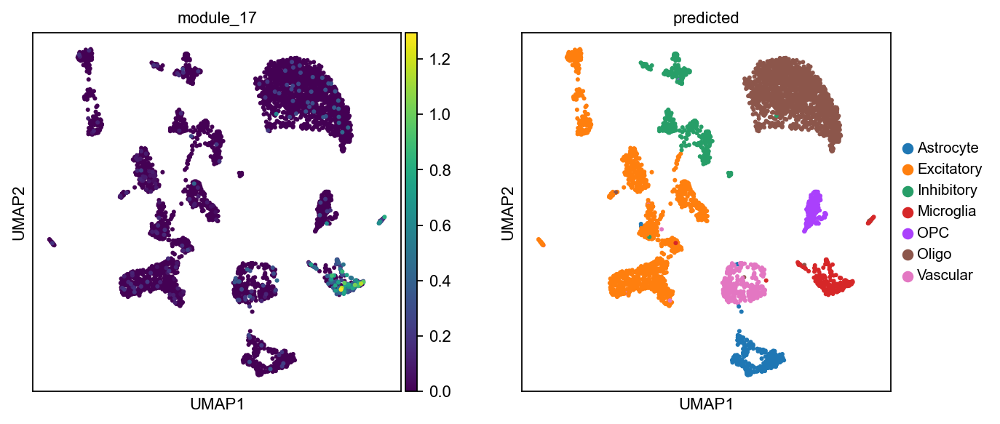

In [13]:
for module_ID in module_genes.keys():
    sc.pl.umap(adata_sc, color=['module_'+str(module_ID), key_class1])
    sc.pl.umap(adata_sp, color=['module_'+str(module_ID), 'predicted'])